In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import yfinance as yf

# Enable Google interactive table
from google.colab import data_table
data_table.enable_dataframe_formatter()

**Load all data**

In [2]:
# Define the currency pairs you want to download data for
currency_pairs = {
    "BTC-USD": "Bitcoin/USD",
    "ETH-USD": "Ethereum/USD",
    "DASH-USD": "Dash/USD",
    "ADA-USD": "Cardano/USD",
#    "SOL-USD": "Solana/USD",
    "DOGE-USD": "Dogecoin/USD",
    "DOT-USD": "Polkadot/USD",
    "LTC-USD": "Litecoin/USD",
#    "MATIC-USD": "Polygon/USD",
#    "SHIB-USD": "Shiba Inu/USD",
#    "AVAX-USD": "Avalanche/USD",
#    "UNI-USD": "Uniswap/USD",
#    "LINK-USD": "Chainlink/USD",
#    "ATOM-USD": "Cosmos/USD",
    "XPR-USD": "Ripple/USD",
    "XMR-USD": "Monero/USD",
    "NEO-USD": "Neo/USD",
#    "ICP-USD": "Internet Computer/USD",
#    "AAVE-USD": "Aave/USD",
#    "FTM-USD": "Fantom/USD",
#    "SAND-USD": "The Sandbox/USD"
}


# Initialize an empty list to store individual DataFrames
dataframes = []

# Download data for each currency pair and store it in a flat format
for ticker, name in currency_pairs.items():
    # Download historical data for each pair
    data = yf.download(ticker, start="2022-12-10", interval="1h")

    # Add a new column to identify the currency pair
    data = data.rename(columns={'High': name + "_High"})
    data = data.rename(columns={'Low': name + "_Low"})
    data = data.rename(columns={'Close': name + "_Close"})
    data = data.rename(columns={'Open': name + "_Open"})
    print(len(data))

    # Append the DataFrame to the list
    dataframes.append(data[[name + "_High",name + "_Low",name + "_Open",name + "_Close"]])

# Concatenate all the DataFrames into one
df = pd.concat(dataframes, axis=1)

# Display the flat DataFrame
df.head()


[*********************100%***********************]  1 of 1 completed


16066


[*********************100%***********************]  1 of 1 completed


16065


[*********************100%***********************]  1 of 1 completed


16065


[*********************100%***********************]  1 of 1 completed


16066


[*********************100%***********************]  1 of 1 completed


16059


[*********************100%***********************]  1 of 1 completed


15966


[*********************100%***********************]  1 of 1 completed


16059


[*********************100%***********************]  1 of 1 completed


16066


[*********************100%***********************]  1 of 1 completed


16066


[*********************100%***********************]  1 of 1 completed


16066


,Bitcoin/USD_High,Bitcoin/USD_Low,Bitcoin/USD_Open,Bitcoin/USD_Close,Ethereum/USD_High,Ethereum/USD_Low,Ethereum/USD_Open,Ethereum/USD_Close,Dash/USD_High,Dash/USD_Low,...,Ripple/USD_Open,Ripple/USD_Close,Monero/USD_High,Monero/USD_Low,Monero/USD_Open,Monero/USD_Close,Neo/USD_High,Neo/USD_Low,Neo/USD_Open,Neo/USD_Close
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-12-10 00:00:00+00:00,17158.863281,17131.363281,17134.220703,17158.210938,1266.223877,1263.747925,1264.375488,1265.325317,46.676456,46.502617,...,0.001949,0.002011,149.739548,149.054184,149.054184,149.739548,7.076201,7.033070,7.035270,7.076201
2022-12-10 01:00:00+00:00,17168.287109,17156.994141,17157.912109,17161.820312,1267.885376,1265.329224,1265.329224,1266.699707,46.925465,46.674923,...,0.002027,0.002043,149.925720,149.568970,149.722809,149.749634,7.089470,7.075390,7.075390,7.086739
2022-12-10 02:00:00+00:00,17165.693359,17138.171875,17161.646484,17147.785156,1266.942017,1264.574829,1266.714111,1265.284546,46.927994,46.552425,...,0.002022,0.002064,149.740601,148.877365,149.740601,148.882523,7.090491,7.073722,7.087139,7.076280
2022-12-10 03:00:00+00:00,17159.437500,17144.406250,17147.160156,17152.617188,1266.208130,1264.258789,1265.259399,1266.188721,46.556744,46.350998,...,0.002068,0.002011,149.356537,148.869995,148.869995,148.972900,7.086027,7.068595,7.075699,7.086027
2022-12-10 04:00:00+00:00,17162.927734,17147.490234,17152.783203,17159.685547,1266.629028,1265.448608,1266.186279,1265.933960,46.580166,46.365551,...,0.002016,0.002002,148.977463,148.526764,148.950058,148.549438,7.096273,7.082898,7.086859,7.093381


**Preprocess data**

In [4]:
# Just forward fill null values
df = df.ffill()

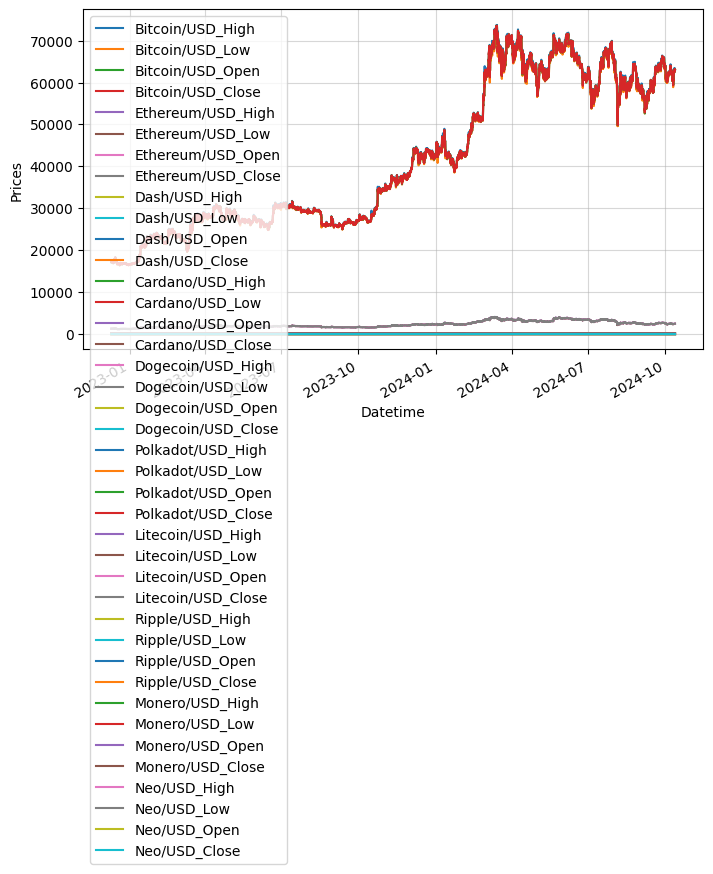

In [5]:
df.plot(figsize=(8,5))
plt.grid(alpha=0.5)
plt.ylabel('Prices')
plt.show()

In [6]:
# Convert data to log return to make it stationary
df_logret = np.log(df).diff()
df_logret.dropna(inplace=True)
df_logret

,Bitcoin/USD_High,Bitcoin/USD_Low,Bitcoin/USD_Open,Bitcoin/USD_Close,Ethereum/USD_High,Ethereum/USD_Low,Ethereum/USD_Open,Ethereum/USD_Close,Dash/USD_High,Dash/USD_Low,...,Ripple/USD_Open,Ripple/USD_Close,Monero/USD_High,Monero/USD_Low,Monero/USD_Open,Monero/USD_Close,Neo/USD_High,Neo/USD_Low,Neo/USD_Open,Neo/USD_Close
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-12-10 01:00:00+00:00,0.000549,0.001495,0.001382,0.000210,0.001311,0.001250,0.000754,0.001086,0.005321,0.003698,...,0.039094,0.015663,0.001243,0.003448,0.004476,0.000067,0.001873,0.005999,0.005687,0.001488
2022-12-10 02:00:00+00:00,-0.000151,-0.001098,0.000218,-0.000818,-0.000744,-0.000596,0.001094,-0.001118,0.000054,-0.002628,...,-0.002229,0.010386,-0.001236,-0.004635,0.000119,-0.005807,0.000144,-0.000236,0.001659,-0.001477
2022-12-10 03:00:00+00:00,-0.000365,0.000364,-0.000844,0.000282,-0.000579,-0.000250,-0.001149,0.000714,-0.007943,-0.004336,...,0.022493,-0.025782,-0.002568,-0.000050,-0.005831,0.000607,-0.000630,-0.000725,-0.001615,0.001377
2022-12-10 04:00:00+00:00,0.000203,0.000180,0.000328,0.000412,0.000332,0.000941,0.000732,-0.000201,0.000503,0.000314,...,-0.025707,-0.004863,-0.002541,-0.002308,0.000538,-0.002847,0.001445,0.002021,0.001576,0.001037
2022-12-10 05:00:00+00:00,-0.000164,0.000015,0.000413,-0.000695,-0.000434,-0.000355,-0.000193,-0.000738,0.005392,0.004619,...,-0.006218,0.001882,0.001160,-0.000351,-0.002679,0.002865,0.001861,0.001387,0.000911,0.002022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-12 17:00:00+00:00,-0.002185,-0.000139,-0.001267,0.000286,-0.002237,-0.001154,-0.000602,0.001291,-0.000059,0.000016,...,-0.002011,-0.000839,-0.000787,-0.000894,0.000086,-0.002712,0.001340,-0.000106,0.000194,0.001038
2024-10-12 18:00:00+00:00,-0.001148,-0.002068,0.000359,-0.002493,0.000883,0.000055,0.001909,-0.002390,-0.000355,-0.000759,...,0.002156,-0.003976,-0.001253,-0.003453,-0.002768,-0.003712,-0.002262,-0.001090,0.001166,-0.001125
2024-10-12 19:00:00+00:00,-0.001728,-0.000118,-0.002545,0.001239,-0.003172,-0.000476,-0.002387,0.001066,-0.000464,0.000544,...,-0.002064,0.000525,-0.003673,-0.004082,-0.003700,-0.003719,-0.002133,0.000133,-0.001056,-0.001080


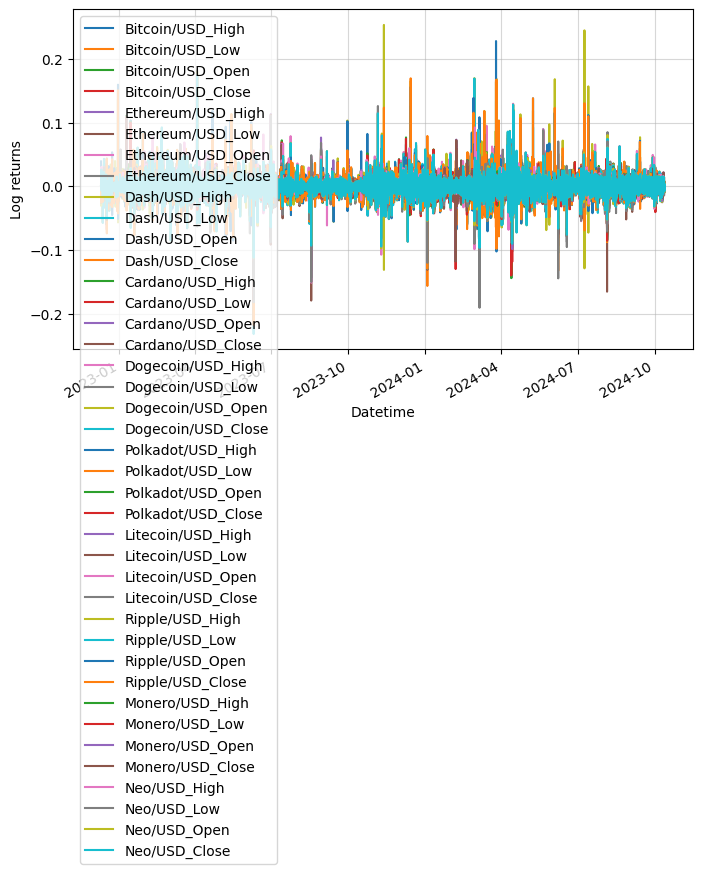

In [7]:
df_logret.plot(figsize=(8,5))
plt.grid(alpha=0.5)
plt.ylabel('Log returns')
plt.show()

In [8]:
# Identify correlation between different pairs
corr = df_logret.corr()
corr

,Bitcoin/USD_High,Bitcoin/USD_Low,Bitcoin/USD_Open,Bitcoin/USD_Close,Ethereum/USD_High,Ethereum/USD_Low,Ethereum/USD_Open,Ethereum/USD_Close,Dash/USD_High,Dash/USD_Low,...,Ripple/USD_Open,Ripple/USD_Close,Monero/USD_High,Monero/USD_Low,Monero/USD_Open,Monero/USD_Close,Neo/USD_High,Neo/USD_Low,Neo/USD_Open,Neo/USD_Close
Bitcoin/USD_High,1.000000,0.454066,0.543081,0.560885,0.805293,0.369620,0.454146,0.463955,0.580542,0.335711,...,0.126568,0.178700,0.357764,0.243267,0.257264,0.209307,0.511881,0.313701,0.345231,0.319173
Bitcoin/USD_Low,0.454066,1.000000,0.517172,0.575743,0.387035,0.840727,0.417487,0.512334,0.311461,0.680021,...,0.075298,0.214374,0.222785,0.444587,0.198549,0.288749,0.293125,0.640506,0.280645,0.416831
Bitcoin/USD_Open,0.543081,0.517172,1.000000,0.005151,0.484336,0.416565,0.842171,0.007880,0.428509,0.351394,...,0.203217,0.105615,0.276210,0.233194,0.415739,0.022668,0.377656,0.331066,0.592774,0.036183
Bitcoin/USD_Close,0.560885,0.575743,0.005151,1.000000,0.448656,0.489973,-0.005763,0.840577,0.302769,0.417247,...,0.007746,0.200659,0.199548,0.299435,0.014652,0.415039,0.277791,0.394318,0.009493,0.594060
Ethereum/USD_High,0.805293,0.387035,0.484336,0.448656,1.000000,0.434128,0.558956,0.566254,0.623282,0.353864,...,0.133056,0.176682,0.360198,0.245260,0.261979,0.208322,0.541592,0.324702,0.370575,0.332706
Ethereum/USD_Low,0.369620,0.840727,0.416565,0.489973,0.434128,1.000000,0.490528,0.588306,0.316496,0.709250,...,0.075726,0.213001,0.220900,0.445904,0.190996,0.293138,0.294209,0.659324,0.274115,0.436921
Ethereum/USD_Open,0.454146,0.417487,0.842171,-0.005763,0.558956,0.490528,1.000000,0.009341,0.455668,0.356134,...,0.207898,0.107058,0.279244,0.232006,0.423508,0.019962,0.390702,0.333742,0.623235,0.034895
Ethereum/USD_Close,0.463955,0.512334,0.007880,0.840577,0.566254,0.588306,0.009341,1.000000,0.328605,0.454283,...,0.008518,0.201649,0.203079,0.310044,0.008803,0.423407,0.300307,0.419289,0.006302,0.625827
Dash/USD_High,0.580542,0.311461,0.428509,0.302769,0.623282,0.316496,0.455668,0.328605,1.000000,0.462026,...,0.159983,0.163667,0.374202,0.240905,0.319167,0.189247,0.568935,0.309231,0.454980,0.303206
Dash/USD_Low,0.335711,0.680021,0.351394,0.417247,0.353864,0.709250,0.356134,0.454283,0.462026,1.000000,...,0.080596,0.219111,0.228238,0.484191,0.199501,0.329587,0.327191,0.731294,0.310300,0.470379


In [9]:
def reframe_to_supervised(df:pd.Series, window_size=7, target=True, target_name=False):
    # Initialize empty dataframe
    df_supervised = pd.DataFrame()

    # Define columns names

    if target:

        if target_name:
            X_columns = [f't-{window_size-i} ({df.name})' for i in range(window_size)]
            columns = X_columns + [f'target ({df.name})']
        else:
            X_columns = [f't-{window_size-i}' for i in range(window_size)]
            columns = X_columns + ['target']
    else:
        X_columns = [f't-{window_size-i} ({df.name})' for i in range(window_size)]
        columns = X_columns

    # Iterate
    for i in range(0, df.shape[0] - window_size):
        # Extract the last "window_size" observations and target
        # value and create an individual dataframe with this info
        if target:
            df_supervised_i = pd.DataFrame([df.values[i:i+window_size+1]],
                                          columns=columns,
                                          index=[df.index[i+window_size]])
        else:
            df_supervised_i = pd.DataFrame([df.values[i:i+window_size]],
                                          columns=columns,
                                          index=[df.index[i+window_size]])
        # Add to the final dataframe
        df_supervised = pd.concat((df_supervised, df_supervised_i), axis=0)

    return df_supervised

In [10]:
# Convert dataframe into supervised learning task
df_supervised = reframe_to_supervised(df_logret['Bitcoin/USD_Close'], window_size=6)
df_supervised

,t-6,t-5,t-4,t-3,t-2,t-1,target
2022-12-10 07:00:00+00:00,0.000210,-0.000818,0.000282,0.000412,-0.000695,0.000459,0.000300
2022-12-10 08:00:00+00:00,-0.000818,0.000282,0.000412,-0.000695,0.000459,0.000300,-0.000666
2022-12-10 09:00:00+00:00,0.000282,0.000412,-0.000695,0.000459,0.000300,-0.000666,-0.000234
2022-12-10 10:00:00+00:00,0.000412,-0.000695,0.000459,0.000300,-0.000666,-0.000234,0.001143
2022-12-10 11:00:00+00:00,-0.000695,0.000459,0.000300,-0.000666,-0.000234,0.001143,0.000401
...,...,...,...,...,...,...,...
2024-10-12 17:00:00+00:00,-0.001767,0.002069,0.000468,0.002854,-0.001968,-0.000691,0.000286
2024-10-12 18:00:00+00:00,0.002069,0.000468,0.002854,-0.001968,-0.000691,0.000286,-0.002493
2024-10-12 19:00:00+00:00,0.000468,0.002854,-0.001968,-0.000691,0.000286,-0.002493,0.001239
2024-10-12 20:00:00+00:00,0.002854,-0.001968,-0.000691,0.000286,-0.002493,0.001239,0.000550


In [12]:
# Specifically focus on High, Low, Open Close because I believe it shows most recent behavior on the market
correlated_pairs = ["Bitcoin/USD_High",	"Bitcoin/USD_Low","Bitcoin/USD_Open", "Ethereum/USD_High",	"Ethereum/USD_Low",	"Ethereum/USD_Close" ]
for pair in correlated_pairs:
    df_supervised_x = reframe_to_supervised(df_logret[pair], window_size=3, target=False)
    df_supervised = pd.concat((df_supervised, df_supervised_x), axis=1).dropna()

In [13]:
# Columns used for model training
df_supervised.columns

Index(['t-6', 't-5', 't-4', 't-3', 't-2', 't-1', 'target',
       't-3 (Bitcoin/USD_High)', 't-2 (Bitcoin/USD_High)',
       't-1 (Bitcoin/USD_High)', 't-3 (Bitcoin/USD_Low)',
       't-2 (Bitcoin/USD_Low)', 't-1 (Bitcoin/USD_Low)',
       't-3 (Bitcoin/USD_Open)', 't-2 (Bitcoin/USD_Open)',
       't-1 (Bitcoin/USD_Open)', 't-3 (Ethereum/USD_High)',
       't-2 (Ethereum/USD_High)', 't-1 (Ethereum/USD_High)',
       't-3 (Ethereum/USD_Low)', 't-2 (Ethereum/USD_Low)',
       't-1 (Ethereum/USD_Low)', 't-3 (Ethereum/USD_Close)',
       't-2 (Ethereum/USD_Close)', 't-1 (Ethereum/USD_Close)'],
      dtype='object')

In [14]:
df_supervised

,t-6,t-5,t-4,t-3,t-2,t-1,target,t-3 (Bitcoin/USD_High),t-2 (Bitcoin/USD_High),t-1 (Bitcoin/USD_High),...,t-1 (Bitcoin/USD_Open),t-3 (Ethereum/USD_High),t-2 (Ethereum/USD_High),t-1 (Ethereum/USD_High),t-3 (Ethereum/USD_Low),t-2 (Ethereum/USD_Low),t-1 (Ethereum/USD_Low),t-3 (Ethereum/USD_Close),t-2 (Ethereum/USD_Close),t-1 (Ethereum/USD_Close)
2022-12-10 07:00:00+00:00,0.000210,-0.000818,0.000282,0.000412,-0.000695,0.000459,0.000300,0.000203,-0.000164,0.000066,...,-0.000710,0.000332,-0.000434,-0.000049,0.000941,-0.000355,-0.000152,-0.000201,-0.000738,0.000704
2022-12-10 08:00:00+00:00,-0.000818,0.000282,0.000412,-0.000695,0.000459,0.000300,-0.000666,-0.000164,0.000066,0.000598,...,0.000402,-0.000434,-0.000049,0.000542,-0.000355,-0.000152,0.000583,-0.000738,0.000704,-0.000194
2022-12-10 09:00:00+00:00,0.000282,0.000412,-0.000695,0.000459,0.000300,-0.000666,-0.000234,0.000066,0.000598,-0.000565,...,0.000330,-0.000049,0.000542,-0.000479,-0.000152,0.000583,-0.000964,0.000704,-0.000194,-0.000889
2022-12-10 10:00:00+00:00,0.000412,-0.000695,0.000459,0.000300,-0.000666,-0.000234,0.001143,0.000598,-0.000565,-0.000700,...,-0.000608,0.000542,-0.000479,-0.000917,0.000583,-0.000964,-0.001746,-0.000194,-0.000889,0.000140
2022-12-10 11:00:00+00:00,-0.000695,0.000459,0.000300,-0.000666,-0.000234,0.001143,0.000401,-0.000565,-0.000700,0.000883,...,-0.000209,-0.000479,-0.000917,0.001063,-0.000964,-0.001746,0.002069,-0.000889,0.000140,0.000856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-12 17:00:00+00:00,-0.001767,0.002069,0.000468,0.002854,-0.001968,-0.000691,0.000286,0.004283,0.000855,-0.000936,...,-0.001251,0.006836,0.001196,0.001325,0.000925,0.003766,0.001768,0.004163,-0.000045,0.000450
2024-10-12 18:00:00+00:00,0.002069,0.000468,0.002854,-0.001968,-0.000691,0.000286,-0.002493,0.000855,-0.000936,-0.002185,...,-0.001267,0.001196,0.001325,-0.002237,0.003766,0.001768,-0.001154,-0.000045,0.000450,0.001291
2024-10-12 19:00:00+00:00,0.000468,0.002854,-0.001968,-0.000691,0.000286,-0.002493,0.001239,-0.000936,-0.002185,-0.001148,...,0.000359,0.001325,-0.002237,0.000883,0.001768,-0.001154,0.000055,0.000450,0.001291,-0.002390
2024-10-12 20:00:00+00:00,0.002854,-0.001968,-0.000691,0.000286,-0.002493,0.001239,0.000550,-0.002185,-0.001148,-0.001728,...,-0.002545,-0.002237,0.000883,-0.003172,-0.001154,0.000055,-0.000476,0.001291,-0.002390,0.001066


**Split data into train, test, and validation**

In [15]:
# Define the proportion of samples for each dataset
training_proportion = 0.70
testing_proportion = 0.20
validation_proportion = 0.10



# Calculate the number of observations
n_obs = df_supervised.shape[0]

# Calculate the number of samples for training, testing, and validation
n_train = int(n_obs * training_proportion)
n_test = int(n_obs * testing_proportion)
n_val = n_obs - n_train - n_test  # Remaining samples go to validation

# Create the splits
df_train = df_supervised.iloc[:n_train]                           # Training set
df_test = df_supervised.iloc[n_train:n_train + n_test]            # Test set
df_val = df_supervised.iloc[n_train + n_test:]                    # Validation set

# Print the size of each set to verify
print(f"Training set: {len(df_train)} samples")
print(f"Test set: {len(df_test)} samples")
print(f"Validation set: {len(df_val)} samples")


Training set: 11241 samples
Test set: 3211 samples
Validation set: 1607 samples


In [16]:
# target in this case is a log return of close price for BTC in the next hour
X_train = df_train.drop(columns=['target'])
y_train = df_train['target']

X_test = df_test.drop(columns=['target'])
y_test = df_test['target']

X_val = df_val.drop(columns=['target'])
y_val = df_val['target']

**Train and Save Model**

In [19]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

# Convert the datasets into DMatrix
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test)

# Set XGBoost parameters with improvements
param = {
    'max_depth': 6,                     # Increase tree depth for more complex interactions
    'eta': 0.05,                        # Lower learning rate for gradual learning
    'objective': 'reg:squarederror',    # Regression problem
    'subsample': 0.8,                   # Row subsampling to prevent overfitting
    'colsample_bytree': 0.8,            # Column subsampling for feature selection
    'lambda': 1,                        # L2 regularization (default)
    'alpha': 0.5,                       # L1 regularization to add sparsity
    'gamma': 0.1,                       # Minimum loss reduction to split
    'tree_method': 'exact',              # Efficient tree building
}

# Number of boosting rounds (more rounds due to lower learning rate)
num_round = 500

# Train the model with early stopping
bst = xgb.train(param, dtrain, num_round)

# Predict the target for the test set
y_pred = bst.predict(dtest)

# Calculate and print the RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"RMSE: {rmse}")

RMSE: 0.005529422461175119


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:
# Save to a model file
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

# Print the current date and time
print("Current Date and Time:", current_datetime)

 # Save the model
model_filename = f'btc_xgboost_model_1h_{current_datetime}.json'
bst.save_model(model_filename)

# Later, when you want to load and use the model:
loaded_model = xgb.Booster()
loaded_model.load_model(model_filename)

Current Date and Time: 2024-10-10 09:01:42.609545


**Backtest on test data**

In [21]:
import numpy as np
import pandas as pd
import datetime

currency = 'Bitcoin/USD'


# Get previous tick's close price for each test set observation
y_previous_close_prices = df.loc[y_test.index[0] - datetime.timedelta(1):, currency + '_Close'].shift(1).dropna()

# Get forecasted Close log return by xgboost
y_pred_xgb = pd.DataFrame(y_pred, columns=['forecast'], index=y_test.index)

# Calculate forecasted actual close price by multiplying forecasted log return and actual previous close price
y_pred_close_prices_xgb = y_previous_close_prices * np.exp(y_pred_xgb.forecast)

# Actual prices based on the true test
y_real_close_prices = df.loc[y_test.index,currency + '_Close']
y_real_open_prices = df.loc[y_test.index,currency + '_Open']

# Create a DataFrame to store actual and predicted prices for backtesting
df_backtest = pd.DataFrame({
    'actual_close_prices': y_real_close_prices,
    'predicted_close_prices': y_pred_close_prices_xgb,
    'actual_open_prices':y_real_open_prices,
    'previous_tick_prices': y_previous_close_prices,
    'y_test_log_returns': y_test,
    'y_pred_log_returns': y_pred,
    'high': df.loc[y_test.index,currency + '_High'],
    'low': df.loc[y_test.index,currency + '_Low']
}, index=y_test.index)

In [22]:
#df_backtest.head(10)
df_backtest

,actual_close_prices,predicted_close_prices,actual_open_prices,previous_tick_prices,y_test_log_returns,y_pred_log_returns,high,low
2024-03-26 04:00:00+00:00,70618.929688,70463.648695,70448.914062,70454.804688,0.002327,0.000125,70678.601562,70440.000000
2024-03-26 05:00:00+00:00,70334.359375,70627.794297,70619.625000,70618.929688,-0.004038,0.000125,70619.625000,70318.242188
2024-03-26 06:00:00+00:00,70607.781250,70343.188263,70334.234375,70334.359375,0.003880,0.000125,70607.781250,70307.828125
2024-03-26 07:00:00+00:00,70544.632812,70616.644460,70632.703125,70607.781250,-0.000895,0.000125,71511.523438,70477.585938
2024-03-26 08:00:00+00:00,70648.453125,70553.488096,70505.265625,70544.632812,0.001471,0.000125,70760.796875,70382.835938
...,...,...,...,...,...,...,...,...
2024-08-06 18:00:00+00:00,56787.812500,56601.291620,56523.437500,56594.187500,0.003415,0.000125,57052.433594,56424.582031
2024-08-06 19:00:00+00:00,56796.257812,56794.940925,56747.398438,56787.812500,0.000149,0.000125,56884.175781,56362.824219
2024-08-06 20:00:00+00:00,56556.003906,56803.387298,56795.414062,56796.257812,-0.004239,0.000125,56844.085938,56342.089844
2024-08-06 21:00:00+00:00,56443.250000,56563.103233,56565.703125,56556.003906,-0.001996,0.000125,56653.566406,56162.640625


In [23]:
# Just printing out actual prices for test dataset to compare with backtest dataset
df.loc[y_test.index[0]:,["Bitcoin/USD_High",	"Bitcoin/USD_Low","Bitcoin/USD_Open","Bitcoin/USD_Close"]]

,Bitcoin/USD_High,Bitcoin/USD_Low,Bitcoin/USD_Open,Bitcoin/USD_Close
Datetime,,,,
2024-03-26 04:00:00+00:00,70678.601562,70440.000000,70448.914062,70618.929688
2024-03-26 05:00:00+00:00,70619.625000,70318.242188,70619.625000,70334.359375
2024-03-26 06:00:00+00:00,70607.781250,70307.828125,70334.234375,70607.781250
2024-03-26 07:00:00+00:00,71511.523438,70477.585938,70632.703125,70544.632812
2024-03-26 08:00:00+00:00,70760.796875,70382.835938,70505.265625,70648.453125
...,...,...,...,...
2024-10-12 17:00:00+00:00,63241.128906,63068.765625,63068.765625,63095.578125
2024-10-12 18:00:00+00:00,63168.539062,62938.488281,63091.421875,62938.488281
2024-10-12 19:00:00+00:00,63059.464844,62931.082031,62931.082031,63016.546875


In [33]:
"""
My strategy is to have 0.1% of entry threshold.
I do not care much about exact value predicted by the model,
I only care if that predicted closing price is different for more than 0.1 percent compared to the open price of that candle.
This would give me some level of confidence to enter the trade and show that there will be enough volatility in the predicted direction.
And I set stop loss to be 1%, and take profit 3% from entry price.

I am assuming I have 25K USD, which is why I am trading with 0.3BTC with no leverage.
"""
import pandas as pd

# Parameters
entry_threshold = 0.001  # 0.1% predicted change threshold for entry
stop_loss_pct = 0.01  # 1% stop-loss
take_profit_pct = 0.025 # 2.5% take-profit
lot_size = 0.3
# Initializing the backtest
initial_balance = 25000  # Initial capital
balance = initial_balance
in_trade = False
entry_price = 0
trade_type = None  # "buy" or "sell" or "hold"
trade_history = []

buy_and_hold_balance = initial_balance
buy_price = df_backtest['actual_close_prices'].iloc[0]

# Backtesting loop
for index, row in df_backtest.iterrows():
    actual_price = row['actual_close_prices']
    predicted_price = row['predicted_close_prices']
    previous_tick_price = row['previous_tick_prices']


    open_price = row['actual_open_prices']
    low = row['low']
    high = row['high']
    time = index  # Since time is in the index, access it using index

    # just buy and hold balance at every iteration
    buy_and_hold_balance = initial_balance + (actual_price - buy_price) * lot_size

    # Conditions to enter a trade
    if not in_trade:
        # Check if predicted close price is for 1% different from current open price
        if predicted_price >= open_price * (1 + entry_threshold):  # Buy condition
            in_trade = True
            entry_price = open_price
            trade_type = "buy"
            trade_history.append({'time': time, 'trade': 'buy', 'price': entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})
        elif predicted_price <= open_price * (1 - entry_threshold):  # Sell condition
            in_trade = True
            entry_price = open_price
            trade_type = "sell"
            trade_history.append({'time': time, 'trade': 'sell', 'price': entry_price, 'predicted_price':predicted_price,'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
        else:
            trade_history.append({'time': time, 'trade': 'no trade', 'price':entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})

    # If in a trade, check for stop-loss or take-profit conditions
    # Very important that I use high and low for stop-loss conditions.
    # Also, I first check if stop-loss was hit buy low/high before checking take-profit hit in order to be more strict.
    if in_trade:
        if trade_type == "buy":
            # Stop-loss or take-profit for buy trade
            if low <= entry_price * (1 - stop_loss_pct):  # Stop-loss hit
                loss = (entry_price - (entry_price * (1 - stop_loss_pct)) ) * lot_size
                balance -= loss
                trade_history.append({'time': time, 'trade': 'stop_loss_sell', 'price': actual_price, 'predicted_price':predicted_price, 'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            elif high >= entry_price * (1 + take_profit_pct):  # Take-profit hit
                profit = ((entry_price * (1 + take_profit_pct)) - entry_price) * lot_size
                balance += profit
                trade_history.append({'time': time, 'trade': 'take_profit_sell', 'price': actual_price, 'predicted_price':predicted_price, 'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            else:
                trade_history.append({'time': time, 'trade': 'hold', 'price':entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})
        elif trade_type == "sell":
            # Stop-loss or take-profit for sell trade
            if high >= entry_price * (1 + stop_loss_pct):  # Stop-loss hit
                loss = (entry_price - (entry_price * (1 + stop_loss_pct)) ) * lot_size
                balance += loss
                trade_history.append({'time': time, 'trade': 'stop_loss_buy', 'price': actual_price, 'predicted_price':predicted_price, 'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            elif low <= entry_price * (1 - take_profit_pct):  # Take-profit hit
                profit = (entry_price - (entry_price * (1 - take_profit_pct))) * lot_size
                balance += profit
                trade_history.append({'time': time, 'trade': 'take_profit_buy', 'price': actual_price, 'predicted_price':predicted_price,'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            else:
                trade_history.append({'time': time, 'trade': 'hold', 'price':entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})

# After backtest
final_balance = balance
total_profit_loss = final_balance - initial_balance

# Create a dataframe for trade history
trade_history_df = pd.DataFrame(trade_history)

# Results
print(f"Initial Balance: {initial_balance}")
print(f"Total Profit/Loss: {total_profit_loss}")
print(trade_history_df)


Initial Balance: 25000
Total Profit/Loss: 559.7064199218621
                          time     trade         price  predicted_price  \
0    2024-08-06 23:00:00+00:00  no trade      0.000000     56215.157218   
1    2024-08-07 00:00:00+00:00  no trade      0.000000     56010.018190   
2    2024-08-07 01:00:00+00:00  no trade      0.000000     56305.649045   
3    2024-08-07 02:00:00+00:00  no trade      0.000000     56969.529245   
4    2024-08-07 03:00:00+00:00  no trade      0.000000     56773.989077   
...                        ...       ...           ...              ...   
1662 2024-10-12 17:00:00+00:00      hold  62280.769531     63085.449207   
1663 2024-10-12 18:00:00+00:00      hold  62280.769531     63103.498348   
1664 2024-10-12 19:00:00+00:00      hold  62280.769531     62946.388785   
1665 2024-10-12 20:00:00+00:00      hold  62280.769531     63024.457177   
1666 2024-10-12 21:00:00+00:00      hold  62280.769531     63059.133404   

          balance  buy_and_hold_balance

In [30]:
trade_history_df

,time,trade,price,predicted_price,balance,buy_and_hold_balance
0,2024-08-06 23:00:00+00:00,no trade,0.000000,56215.157218,25000.000000,25000.000000
1,2024-08-07 00:00:00+00:00,no trade,0.000000,56010.018190,25000.000000,25088.678125
2,2024-08-07 01:00:00+00:00,no trade,0.000000,56305.649045,25000.000000,25287.817188
3,2024-08-07 02:00:00+00:00,no trade,0.000000,56969.529245,25000.000000,25229.162500
4,2024-08-07 03:00:00+00:00,no trade,0.000000,56773.989077,25000.000000,25273.425391
...,...,...,...,...,...,...
1662,2024-10-12 17:00:00+00:00,hold,62280.769531,63085.449207,32386.074912,27127.776953
1663,2024-10-12 18:00:00+00:00,hold,62280.769531,63103.498348,32386.074912,27080.650000
1664,2024-10-12 19:00:00+00:00,hold,62280.769531,62946.388785,32386.074912,27104.067578
1665,2024-10-12 20:00:00+00:00,hold,62280.769531,63024.457177,32386.074912,27114.469141


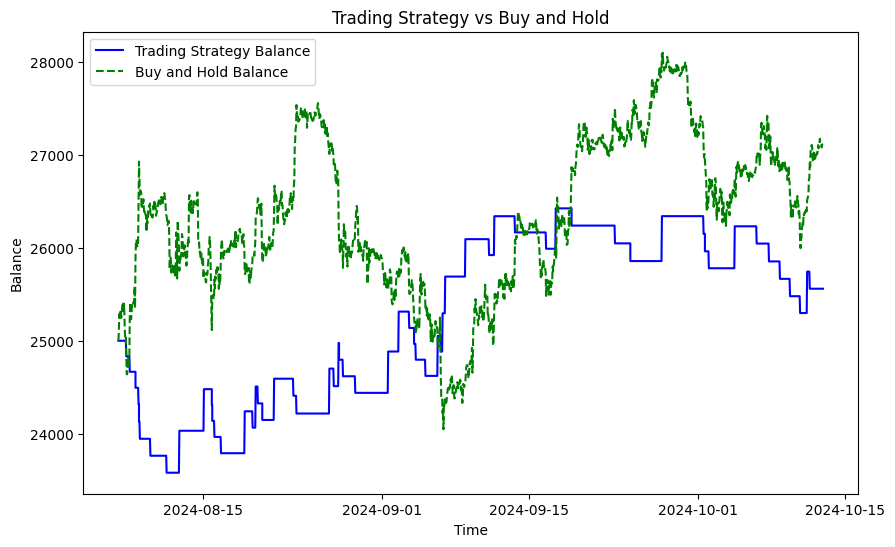

In [34]:
# Visualization
plt.figure(figsize=(10, 6))

# Plot the strategy's balance over time
plt.plot(trade_history_df['time'], trade_history_df['balance'], label='Trading Strategy Balance', color='blue')

# Plot the buy-and-hold balance over time
plt.plot(trade_history_df['time'], trade_history_df['buy_and_hold_balance'], label='Buy and Hold Balance', color='green', linestyle='--')

# Add labels and title
plt.title('Trading Strategy vs Buy and Hold')
plt.xlabel('Time')
plt.ylabel('Balance')
plt.legend()

# Show plot
plt.show()

**Backtest on validation data**

In [26]:
# Let's try and backtest of validationd data

dval = xgb.DMatrix(X_val)


# Predict the target for the val set
y_pred_val = bst.predict(dval)

In [27]:
import numpy as np
import pandas as pd
import datetime

currency = 'Bitcoin/USD'


# Get previous tick's close price for each test set observation
y_previous_close_prices = df.loc[y_val.index[0] - datetime.timedelta(1):, currency + '_Close'].shift(1).dropna()

# Get forecasted Close log return by xgboost
y_pred_xgb = pd.DataFrame(y_pred_val, columns=['forecast'], index=y_val.index)

# Calculate forecasted actual close price by multiplying forecasted log return and actual previous close price
y_pred_close_prices_xgb = y_previous_close_prices * np.exp(y_pred_xgb.forecast)

# Actual prices based on the true test
y_real_close_prices = df.loc[y_val.index,currency + '_Close']
y_real_open_prices = df.loc[y_val.index,currency + '_Open']

# Create a DataFrame to store actual and predicted prices for backtesting
df_backtest = pd.DataFrame({
    'actual_close_prices': y_real_close_prices,
    'predicted_close_prices': y_pred_close_prices_xgb,
    'actual_open_prices':y_real_open_prices,
    'previous_tick_prices': y_previous_close_prices,
    'y_test_log_returns': y_val,
    'y_pred_log_returns': y_pred_val,
    'high': df.loc[y_val.index,currency + '_High'],
    'low': df.loc[y_val.index,currency + '_Low']
}, index=y_val.index)

In [28]:
import pandas as pd

# Parameters
entry_threshold = 0.001  # 0.1% predicted change threshold for entry
stop_loss_pct = 0.01  # 1% stop-loss
take_profit_pct = 0.025 # 2.5% take-profit
lot_size = 0.3
# Initializing the backtest
initial_balance = 25000  # Initial capital
balance = initial_balance
in_trade = False
entry_price = 0
trade_type = None  # "buy" or "sell" or "hold"
trade_history = []

buy_and_hold_balance = initial_balance
buy_price = df_backtest['actual_close_prices'].iloc[0]

# Backtesting loop
for index, row in df_backtest.iterrows():
    actual_price = row['actual_close_prices']
    predicted_price = row['predicted_close_prices']
    previous_tick_price = row['previous_tick_prices']


    open_price = row['actual_open_prices']
    low = row['low']
    high = row['high']
    time = index  # Since time is in the index, access it using index

    # just buy and hold balance at every iteration
    buy_and_hold_balance = initial_balance + (actual_price - buy_price) * lot_size

    # Conditions to enter a trade
    if not in_trade:
        # Check if predicted close price is for 1% different from current open price
        if predicted_price >= open_price * (1 + entry_threshold):  # Buy condition
            in_trade = True
            entry_price = open_price
            trade_type = "buy"
            trade_history.append({'time': time, 'trade': 'buy', 'price': entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})
        elif predicted_price <= open_price * (1 - entry_threshold):  # Sell condition
            in_trade = True
            entry_price = open_price
            trade_type = "sell"
            trade_history.append({'time': time, 'trade': 'sell', 'price': entry_price, 'predicted_price':predicted_price,'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
        else:
            trade_history.append({'time': time, 'trade': 'no trade', 'price':entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})

    # If in a trade, check for stop-loss or take-profit conditions
    # Very important that I use high and low for stop-loss conditions. Also, I first check if stop-loss was hit buy low/high before checking take-profit hit in order to be more stirct.
    if in_trade:
        if trade_type == "buy":
            # Stop-loss or take-profit for buy trade
            if low <= entry_price * (1 - stop_loss_pct):  # Stop-loss hit
                loss = (entry_price - (entry_price * (1 - stop_loss_pct)) ) * lot_size
                balance -= loss
                trade_history.append({'time': time, 'trade': 'stop_loss_sell', 'price': actual_price, 'predicted_price':predicted_price, 'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            elif high >= entry_price * (1 + take_profit_pct):  # Take-profit hit
                profit = ((entry_price * (1 + take_profit_pct)) - entry_price) * lot_size
                balance += profit
                trade_history.append({'time': time, 'trade': 'take_profit_sell', 'price': actual_price, 'predicted_price':predicted_price, 'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            else:
                trade_history.append({'time': time, 'trade': 'hold', 'price':entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})
        elif trade_type == "sell":
            # Stop-loss or take-profit for sell trade
            if high >= entry_price * (1 + stop_loss_pct):  # Stop-loss hit
                loss = (entry_price - (entry_price * (1 + stop_loss_pct)) ) * lot_size
                balance -= loss
                trade_history.append({'time': time, 'trade': 'stop_loss_buy', 'price': actual_price, 'predicted_price':predicted_price, 'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            elif low <= entry_price * (1 - take_profit_pct):  # Take-profit hit
                profit = (entry_price - (entry_price * (1 - take_profit_pct))) * lot_size
                balance += profit
                trade_history.append({'time': time, 'trade': 'take_profit_buy', 'price': actual_price, 'predicted_price':predicted_price,'balance':balance, 'buy_and_hold_balance': buy_and_hold_balance})
                in_trade = False
            else:
                trade_history.append({'time': time, 'trade': 'hold', 'price':entry_price, 'predicted_price':predicted_price, 'balance': balance, 'buy_and_hold_balance': buy_and_hold_balance})

# After backtest
final_balance = balance
total_profit_loss = final_balance - initial_balance

# Create a dataframe for trade history
trade_history_df = pd.DataFrame(trade_history)

# Results
print(f"Initial Balance: {initial_balance}")
print(f"Total Profit/Loss: {total_profit_loss}")
print(trade_history_df)

Initial Balance: 25000
Total Profit/Loss: 7386.074912109358
                          time     trade         price  predicted_price  \
0    2024-08-06 23:00:00+00:00  no trade      0.000000     56215.157218   
1    2024-08-07 00:00:00+00:00  no trade      0.000000     56010.018190   
2    2024-08-07 01:00:00+00:00  no trade      0.000000     56305.649045   
3    2024-08-07 02:00:00+00:00  no trade      0.000000     56969.529245   
4    2024-08-07 03:00:00+00:00  no trade      0.000000     56773.989077   
...                        ...       ...           ...              ...   
1662 2024-10-12 17:00:00+00:00      hold  62280.769531     63085.449207   
1663 2024-10-12 18:00:00+00:00      hold  62280.769531     63103.498348   
1664 2024-10-12 19:00:00+00:00      hold  62280.769531     62946.388785   
1665 2024-10-12 20:00:00+00:00      hold  62280.769531     63024.457177   
1666 2024-10-12 21:00:00+00:00      hold  62280.769531     63059.133404   

           balance  buy_and_hold_balanc

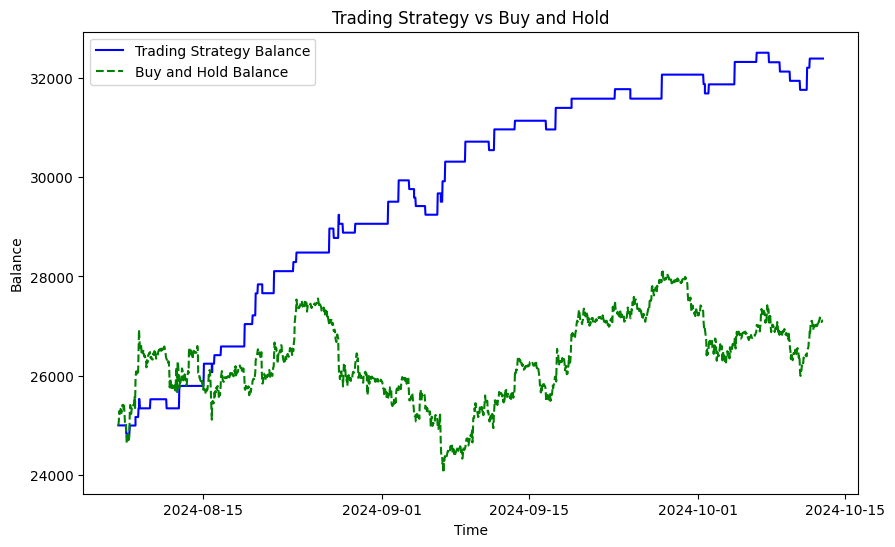

In [29]:
# Visualization
plt.figure(figsize=(10, 6))

# Plot the strategy's balance over time
plt.plot(trade_history_df['time'], trade_history_df['balance'], label='Trading Strategy Balance', color='blue')

# Plot the buy-and-hold balance over time
plt.plot(trade_history_df['time'], trade_history_df['buy_and_hold_balance'], label='Buy and Hold Balance', color='green', linestyle='--')

# Add labels and title
plt.title('Trading Strategy vs Buy and Hold')
plt.xlabel('Time')
plt.ylabel('Balance')
plt.legend()

# Show plot
plt.show()